# Shapiro - Wilk for YouTube Video Engagment Metrics. 

In [1]:
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
# Hiding warnings for cleaner display
#warnings.filterwarnings('ignore')

# Configuring some options
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

%matplotlib inline 

# Importing the Dataset

In [2]:
df_US = pd.read_csv('/Users/michaelsegaline/Desktop/Youtube Data Analysis 2023/YouTube Datasets 2020-2023/US_youtube_trending_data.csv')

# Exploring and Cleaning the dataset

In [3]:
df_US.head()

,video_id,title,publishedA,Unnamed: 3,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,8/11/20,19,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,22,2020-08-12T00:00:00Z,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,156908,5855,35313,https://i.ytimg.com/vi/3C66w5Z0ixs/default.jpg,False,False,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,8/11/20,17,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,20,2020-08-12T00:00:00Z,Apex Legends|Apex Legends characters|new Apex ...,2381688,146739,2794,16549,https://i.ytimg.com/vi/M9Pmf9AB4Mo/default.jpg,False,False,"While running her own modding shop, Ramya Pare..."
2,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,8/11/20,16,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,24,2020-08-12T00:00:00Z,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,353787,2628,40221,https://i.ytimg.com/vi/J78aPJ3VyNs/default.jpg,False,False,I left youtube for a month and this is what ha...
3,kXLn3HkpjaA,XXL 2020 Freshman Class Revealed - Official An...,8/11/20,16,UCbg_UMjlHJg_19SZckaKajg,XXL,10,2020-08-12T00:00:00Z,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,23251,1856,7647,https://i.ytimg.com/vi/kXLn3HkpjaA/default.jpg,False,False,Subscribe to XXL → http://bit.ly/subscribe-xxl...
4,VIUo6yapDbc,Ultimate DIY Home Movie Theater for The LaBran...,8/11/20,15,UCDVPcEbVLQgLZX0Rt6jo34A,Mr. Kate,26,2020-08-12T00:00:00Z,The LaBrant Family|DIY|Interior Design|Makeove...,1123889,45802,964,2196,https://i.ytimg.com/vi/VIUo6yapDbc/default.jpg,False,False,Transforming The LaBrant Family's empty white ...


In [4]:
#-- Now inspecting the data types --#
df_US.dtypes

video_id             object
title                object
publishedA           object
Unnamed: 3            int64
channelId            object
channelTitle         object
categoryId            int64
trending_date        object
tags                 object
view_count            int64
likes                 int64
dislikes              int64
comment_count         int64
thumbnail_link       object
comments_disabled      bool
ratings_disabled       bool
description          object
dtype: object

In [5]:
#-- Checking shape before dropping any null values --#
df_US.shape

(204589, 17)

In [6]:
#-- Dropping any null values --#
df_US = df_US.dropna()

In [7]:
#-- 97.9% full 2.1% Sparse --#
df_US.shape

(200391, 17)

Exploring Descriptive Statistics 

In [8]:
#-- The average number of 'views' per trending video is 2,484,982. --#
#-- The average number of 'likes' per trending video is 127,433 --#
#-- The average number of 'dislikes' per treding video is 1,449 --#
#-- The average 'comment_count' per video is 10,806 --#
df_US.describe()

,Unnamed: 3,categoryId,view_count,likes,dislikes,comment_count
count,200391.000000,200391.000000,2.003910e+05,2.003910e+05,200391.000000,2.003910e+05
mean,13.963980,18.740348,2.484982e+06,1.274337e+05,1449.142367,1.080695e+04
std,6.749721,6.775942,7.128450e+06,4.083902e+05,9087.231500,8.144593e+04
min,0.000000,1.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00
25%,10.000000,17.000000,4.775210e+05,1.840450e+04,0.000000,1.354000e+03
50%,16.000000,20.000000,9.607400e+05,4.187900e+04,0.000000,2.953000e+03
75%,19.000000,24.000000,2.151308e+06,1.036590e+05,795.000000,6.910000e+03
max,23.000000,29.000000,2.777917e+08,1.602153e+07,879354.000000,6.738537e+06


# Univariate Exploration

Frequency distrobution of videos uploaded against the 'Upload_hour' on a 24hour time scale.

Now plotting the distrobution of 'views'.

<AxesSubplot:>

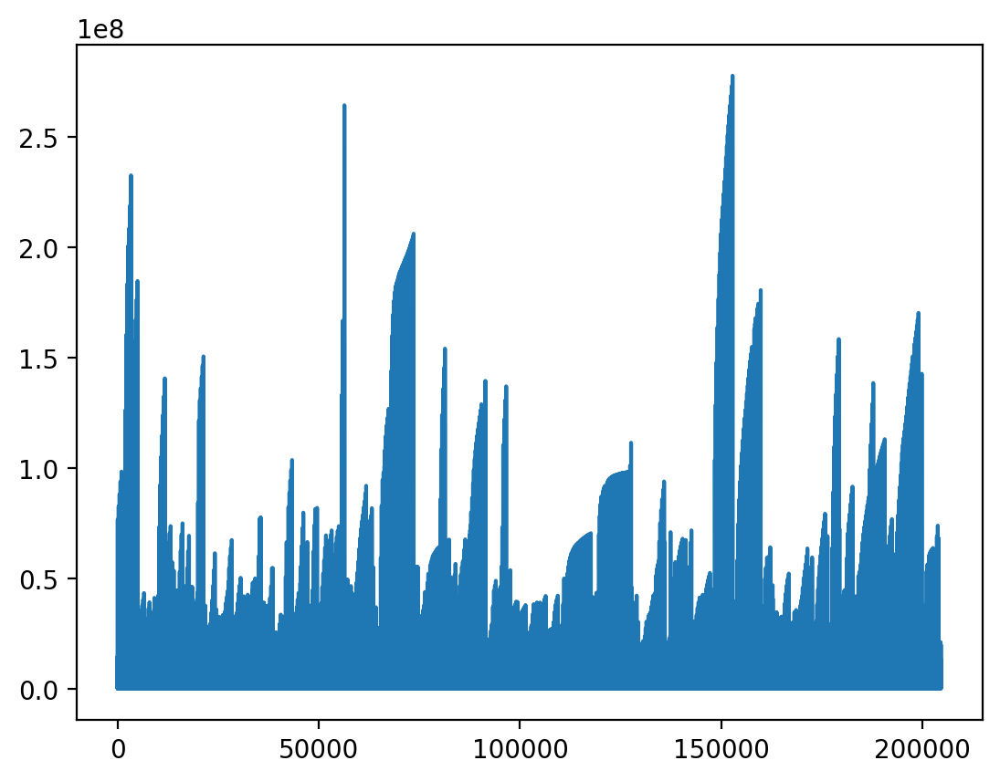

In [9]:
df_US.view_count.plot()

Now plotting the distrobtion of 'likes'. 

<AxesSubplot:>

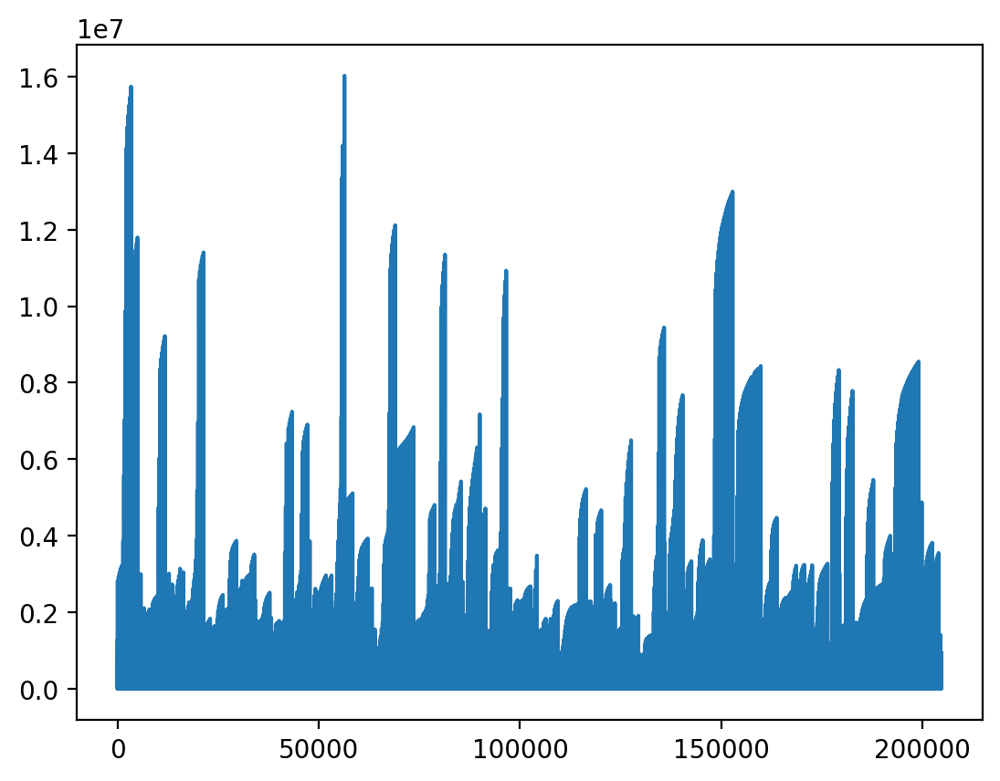

In [10]:
df_US.likes.plot()

Plotting the distrobution of the "comment_count".

<AxesSubplot:>

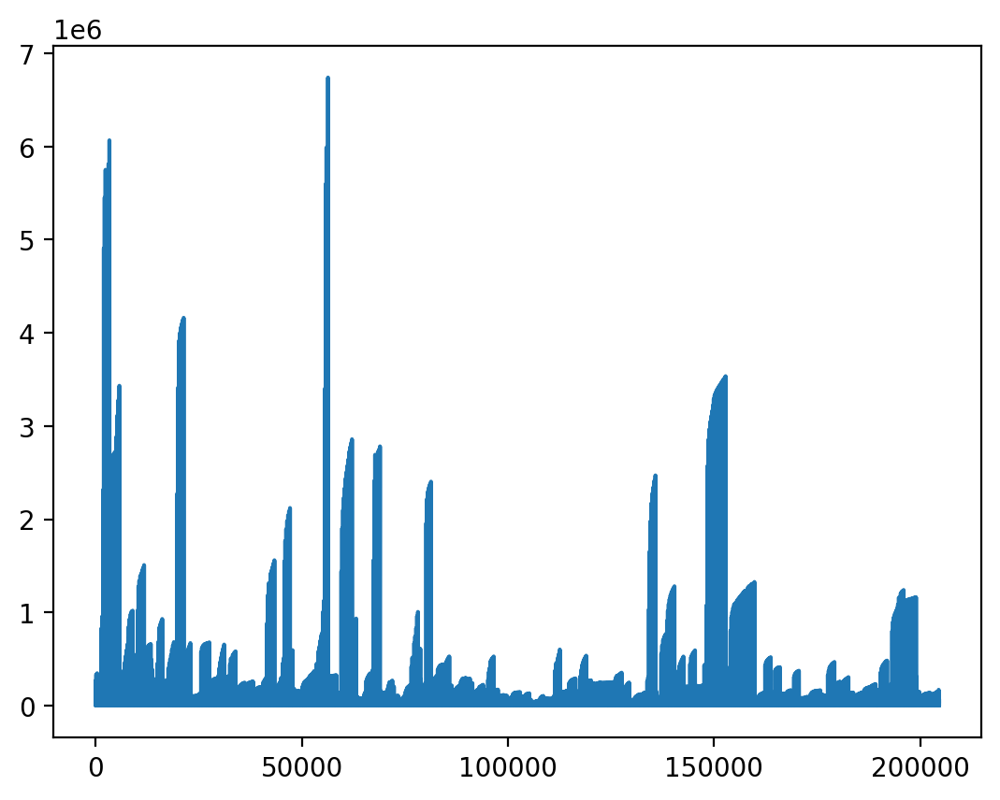

In [11]:
df_US.comment_count.plot()

Plotting the distrobution of 'dislikes'.

It appears that increasing the number of 'dislikes' decreases the view count. Therefore, Youtube is giving the audiance the ability to kill a videos trend and fight against outrage culture. 

<AxesSubplot:>

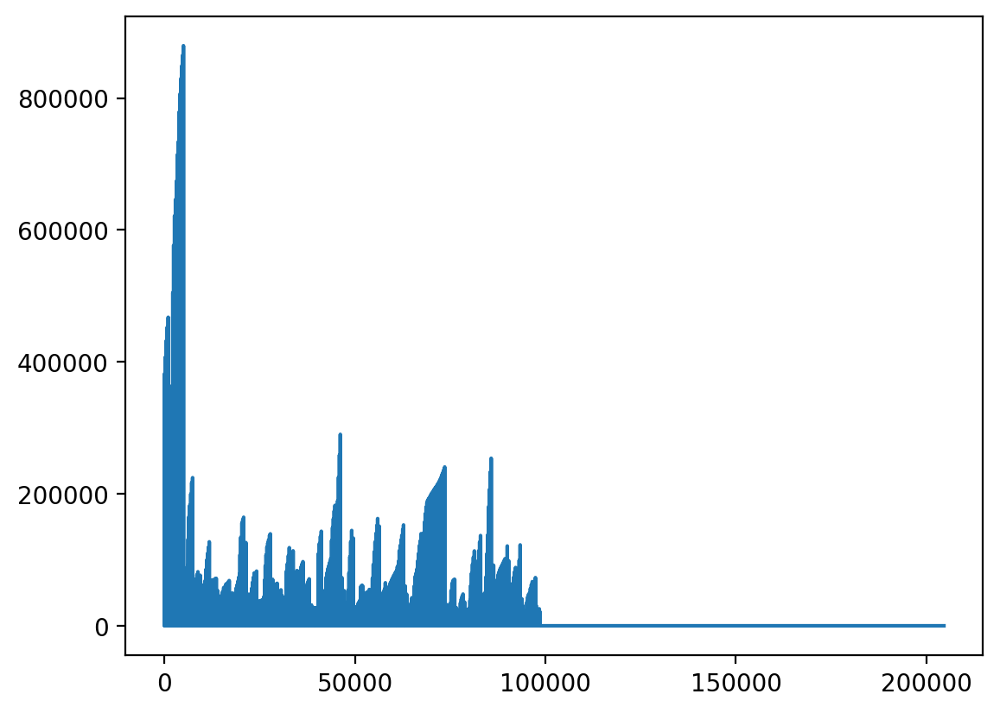

In [12]:
df_US.dislikes.plot()

# Creating the KPI for exploration.

Engagment Per View (EPV) = 'views' / ('likes' + 'dislikes' + 'comment_count')


In [13]:
#-- Creating Total Engagment Per View --#

EPV = df_US.view_count /(df_US.likes + df_US.dislikes + df_US.comment_count)

<AxesSubplot:>

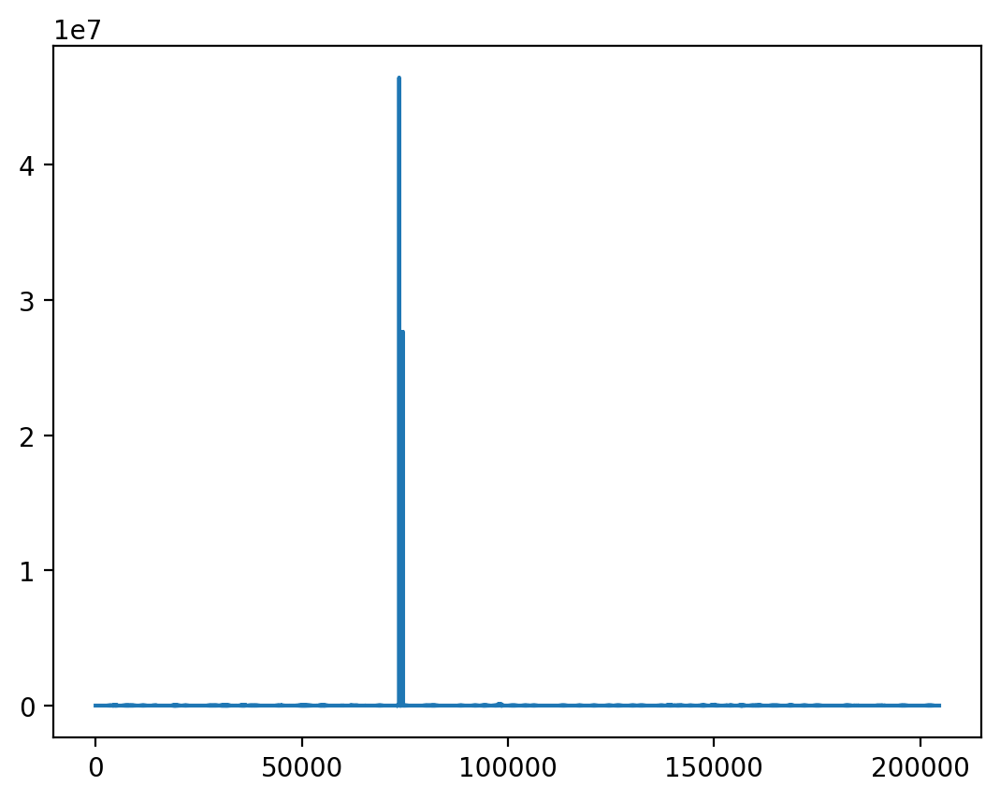

In [14]:
#-- Plotting Total Engagment Per View --#
#-- Outliers excluded, this distrobution appears to have one mode. --#

EPV.plot()

# Conducting a Shapiro - Wilk Tests for normality.

In [15]:
#-- Running Shapiro Wilk test to gage normality of EPV--#
x6 = EPV
shapiro_test = stats.shapiro(x6)
shapiro_test
shapiro_test.statistic
shapiro_test.pvalue

/Users/michaelsegaline/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_morestats.py:1800: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


1.0

In [16]:
#-- Running Shapiro Wilk test to gage normality of 'views'--#
x1 = df_US.view_count
shapiro_test = stats.shapiro(x1)
shapiro_test
shapiro_test.statistic
shapiro_test.pvalue

0.0

In [17]:
#-- Running Shapiro Wilk test to gage normality of 'comment_count'--#
x2 = df_US.comment_count
shapiro_test = stats.shapiro(x2)
shapiro_test
shapiro_test.statistic
shapiro_test.pvalue

0.0

In [18]:
#-- Running Shapiro Wilk test to gage normality of 'likes'--#
x4 = df_US.likes
shapiro_test = stats.shapiro(x4)
shapiro_test
shapiro_test.statistic
shapiro_test.pvalue

0.0

In [19]:
#-- Running Shapiro Wilk test to gage normality of 'dislikes'--#
x5 = df_US.dislikes
shapiro_test = stats.shapiro(x5)
shapiro_test
shapiro_test.statistic
shapiro_test.pvalue

0.0

# Running a Kruskal-Wallis test to compare the differences between groups. 


In [20]:
group1 = df_US.view_count
group2 = df_US.likes
group3 = df_US.dislikes
group4 = df_US.comment_count

In [21]:
#-- Now comparing 'views' and 'likes' --#
stats.kruskal(group1, group2)

KruskalResult(statistic=261601.28221743755, pvalue=0.0)

In [22]:
#-- Now comparing 'views', 'likes', and 'dislikes'--#
stats.kruskal(group1, group2, group3)

KruskalResult(statistic=509978.31476875354, pvalue=0.0)

In [23]:
#-- Now comparing 'views', 'likes', 'dislikes', and 'comment_count' --#
stats.kruskal(group1, group2, group3, group4)

KruskalResult(statistic=671181.6005238973, pvalue=0.0)

# Bivariate Exploration

# Now exploring which video categories get the most views

<AxesSubplot:xlabel='categoryId'>

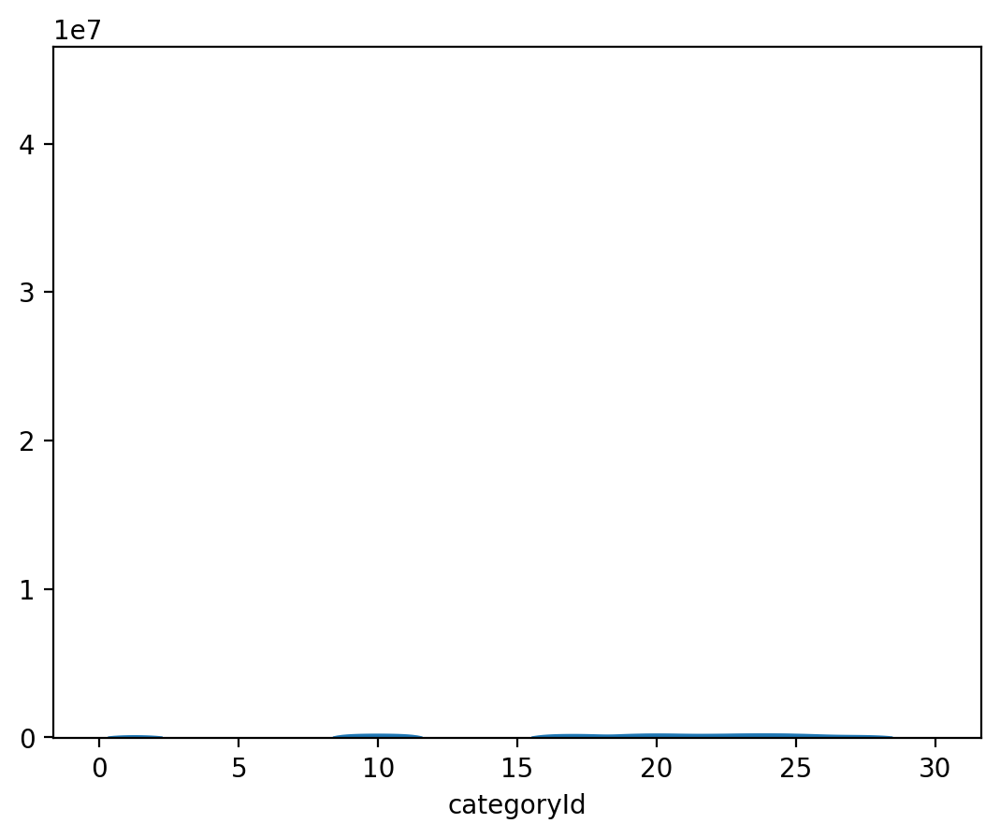

In [48]:

#-- Creating a Density Plot --#
sns.kdeplot(data=df_US, x= "categoryId", y=EPV, multiple="stack")


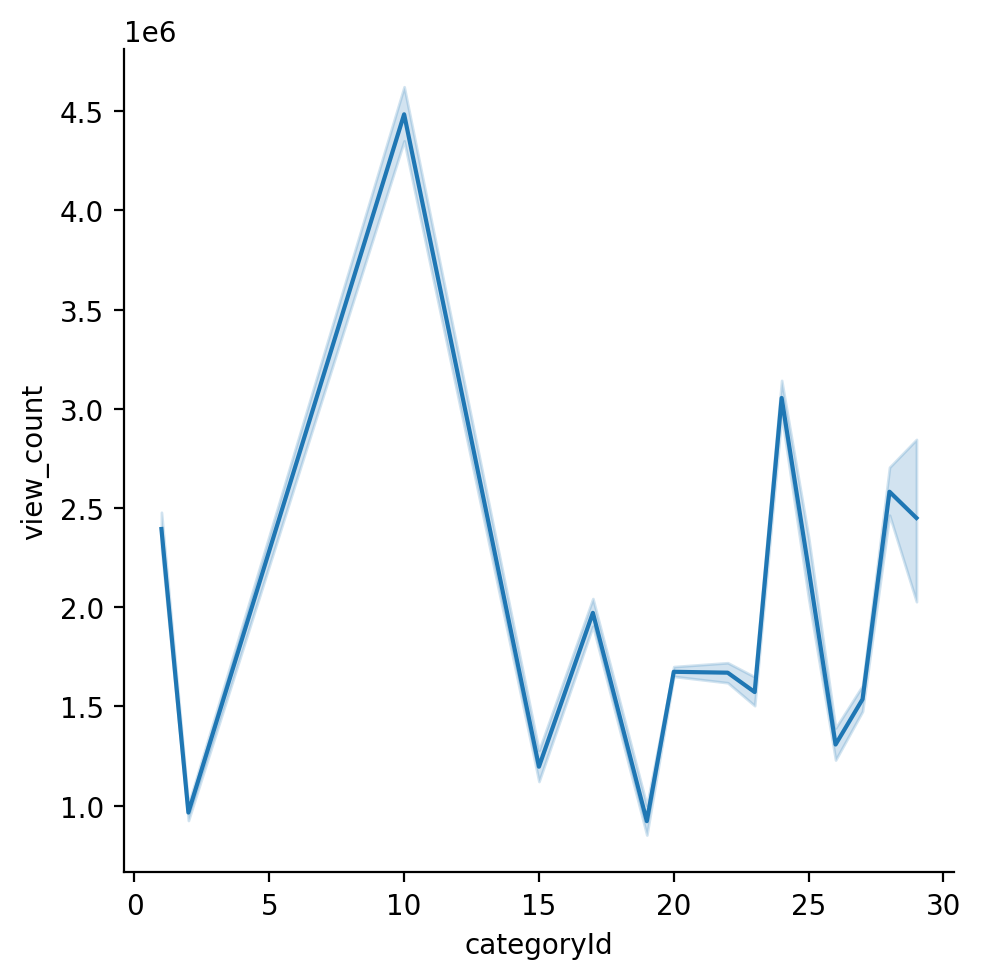

In [24]:


sns.relplot(data=df_US, x="categoryId", y="view_count", kind="line")

# Now inspecting Engagement Per View Against Video Category

It Appears that there is a distinct Bell-Shaped curve for the engagment and that is categories 26 - 28:
26 = How to 
27 = Education
28 = Science & Technology

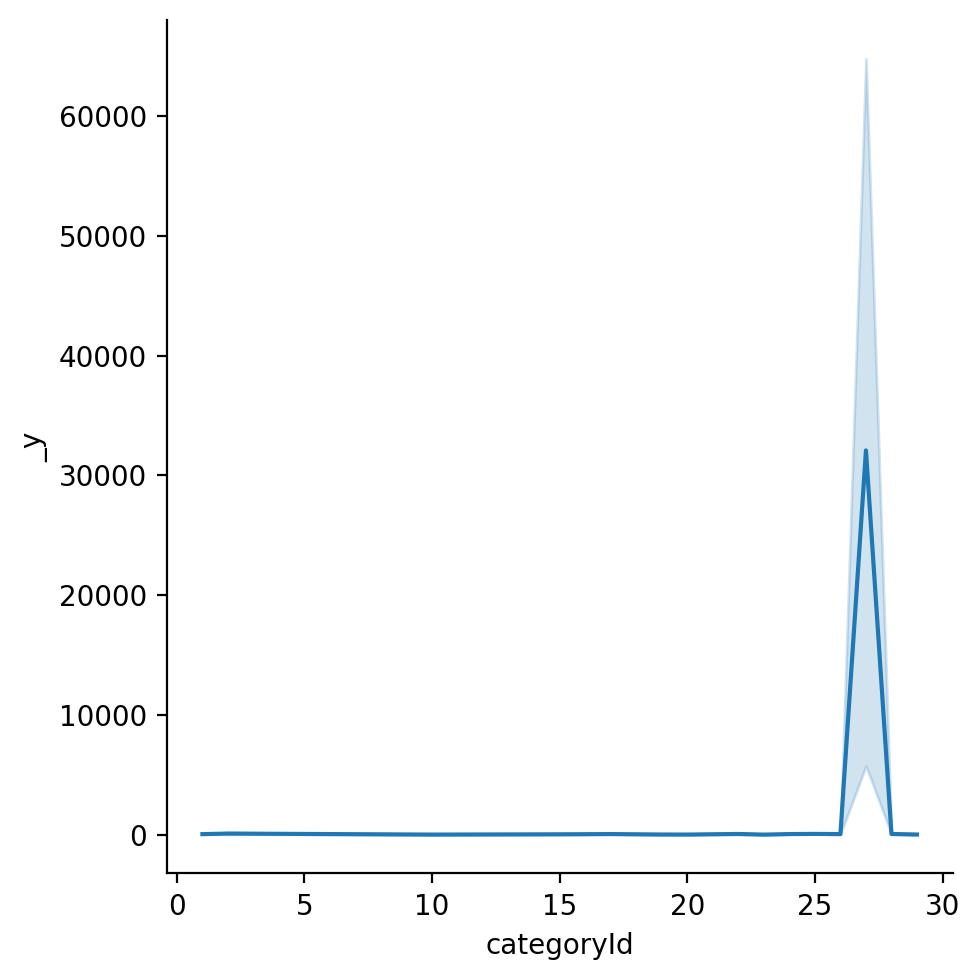

In [25]:
sns.relplot(data=df_US, x="categoryId", y=EPV, kind="line")

It appears Category 10 gets the most views. 

# Exploring Trending Keywords 

In [26]:
from collections import Counter
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import warnings
from collections import Counter
import datetime
import wordcloud
from wordcloud import WordCloud


In [27]:
# Filter the dataframe to only include category_id 10
df_category_10 = df_US[df_US['categoryId'] == 10]

# Combine all the video titles into one string
all_titles = ' '.join(df_category_10['title'])

# Tokenize the string
tokens = word_tokenize(all_titles.lower())

# Filter out stop words
stop_words = set(stopwords.words('english'))
filtered_tokens = [token for token in tokens if token not in stop_words]

# Count the frequency of each word
word_freq = Counter(filtered_tokens)

# Print the 10 most common words
print(word_freq.most_common(100))

[('-', 27396), ('(', 24385), (')', 24346), ('video', 18632), ('official', 18273), ('music', 6823), (',', 5829), ('[', 4783), (']', 4777), ('.', 3175), ('&', 3145), ('ft.', 3099), ('feat', 2554), ('x', 2389), ('oficial', 2220), ("'", 2215), ('lil', 2197), ('audio', 1985), ('|', 1906), ('live', 1261), ('mv', 1260), ('el', 1142), ('lyric', 1111), ('g', 1047), ('’', 995), ('remix', 976), (':', 958), ('bts', 791), ('la', 781), ("'s", 768), ('!', 749), ('baby', 737), ('love', 737), ('m/v', 609), ('durk', 588), ('teaser', 579), ('performance', 574), ("n't", 565), ('visualizer', 544), ('–', 542), ('big', 529), ('de', 517), ('2', 491), ('‘', 464), ('2021', 463), ('black', 458), ('trailer', 449), ('youngboy', 446), ('awards', 437), ('yo', 425), ('song', 403), ('young', 398), ('“', 393), ('grupo', 393), ('”', 388), ('polo', 382), ('like', 378), ('bad', 377), ('방탄소년단', 372), ('freestyle', 354), ('@', 351), ('los', 339), ('drake', 326), ('#', 324), ('dance', 323), ('never', 316), ('weeknd', 315), (

In [28]:
# Filter the dataframe to only include category_id 10
df_category_10 = df_US[df_US['categoryId'] == 17]

# Combine all the video titles into one string
all_titles = ' '.join(df_category_10['tags'])

# Tokenize the string
tokens = word_tokenize(all_titles.lower())

# Filter out stop words
stop_words = set(stopwords.words('english'))
filtered_tokens = [token for token in tokens if token not in stop_words]

# Count the frequency of each word
word_freq = Counter(filtered_tokens)

# Print the 10 most common words
print(word_freq.most_common(100))

[('vs', 14977), ('league', 3847), ('highlights', 3033), ('perfect', 2589), ('sports', 2544), ('world', 2394), ('game', 2355), ('full', 2268), ('paul', 2108), ('[', 1849), (']', 1849), ('none', 1844), ('vs.', 1809), ('nba', 1738), ('#', 1689), ('united', 1671), ('raw', 1666), ('take', 1611), ('cup', 1587), (':', 1574), ('bottle', 1560), ('de', 1451), ('boxing', 1427), ('mcafee', 1420), ('city', 1412), ('night', 1374), ('first', 1309), ('fc', 1244), ('man', 1134), ('angeles', 1075), ('open', 1072), ('football', 1068), ('manchester', 1050), ('flip|dude', 1026), ('v', 1019), ('premier', 1002), ('state', 957), ('basketball|g', 909), ('davis', 893), ('press', 880), ('garcia', 824), ("'s", 822), ('mcgregor', 821), ('a.', 786), ('ball', 751), ('fox|fox', 731), ('championship', 690), ('redick', 668), ('james', 653), ('madrid', 651), ('wrestling', 642), ('tour', 632), ('champions', 623), ('espn|espn', 613), ('fighting', 596), ('fury', 594), ('weigh', 592), ('jones', 591), ('fight', 582), ('smith

1 = Film & Animation
2 = Autos & Vehicals
10 = Music
15 = Pets & Animals
17 = Sports
18 = Short Movies
19 = Travel & Events
20 = Gaming 
21 = Video Blogging
22 = People and Blogs
23 = Comedy
24 = Entertianment 
25 = News and Politics
26 = How to 
27 = Education
28 = Science & Technology
29 = Non Profits and Activism 


# The Frequency Count of trending Video Categories 

In [29]:
import json
with open("/Users/michaelsegaline/Desktop/Youtube Data Analysis 2023/YouTube Datasets 2020-2023/US_category_id.json") as f:
    categories = json.load(f)["items"]
cat_dict = {}
for cat in categories:
    cat_dict[int(cat["id"])] = cat["snippet"]["title"]
df_US['category_name'] = df_US['categoryId'].map(cat_dict)

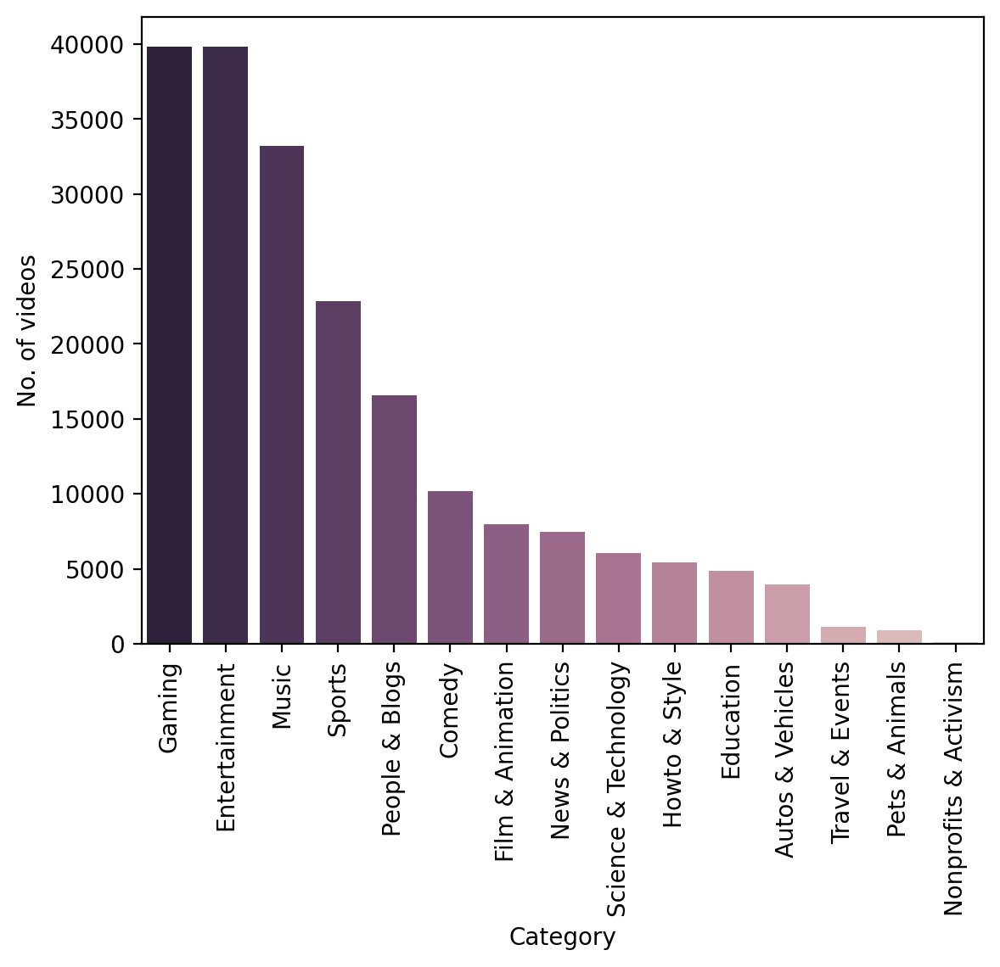

In [30]:
cdf = df_US["category_name"].value_counts().to_frame().reset_index()
cdf.rename(columns={"index": "category_name", "category_name": "No_of_videos"}, inplace=True)
fig, ax = plt.subplots()
_ = sns.barplot(x="category_name", y="No_of_videos", data=cdf, 
                palette=sns.cubehelix_palette(n_colors=16, reverse=True), ax=ax)
_ = ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
_ = ax.set(xlabel="Category", ylabel="No. of videos")

# Most Common Trending Words in Titles

In [31]:
title_words = list(df_US["title"].apply(lambda x: x.split()))
title_words = [x for y in title_words for x in y]
Counter(title_words).most_common(25)

[('|', 53951),
 ('-', 49556),
 ('The', 25255),
 ('I', 18225),
 ('the', 18102),
 ('in', 15190),
 ('(Official', 14317),
 ('Video)', 13044),
 ('&', 12952),
 ('to', 12268),
 ('of', 12150),
 ('a', 11169),
 ('and', 8089),
 ('Trailer', 7972),
 ('A', 7843),
 ('Music', 7587),
 ('on', 6581),
 ('Official', 6191),
 ('Minecraft', 6182),
 ('My', 5713),
 ('To', 5624),
 ('Highlights', 5150),
 ('with', 5010),
 ('In', 4807),
 ('at', 4806)]

# Most Trending Tags for the Gaming Category

In [32]:
# Filter the dataframe to only include category_id 20

df_category_20_tags = df_US[df_US['categoryId'] == 20]

# Filter the dataframe to only include category_id 10
df_category_20 = df_US[df_US['categoryId'] == 20]

# Combine all the video titles into one string
all_titles = ' '.join(df_category_20['tags'])

# Tokenize the string
tokens = word_tokenize(all_titles.lower())

# Filter out stop words
stop_words = set(stopwords.words('english'))
filtered_tokens = [token for token in tokens if token not in stop_words]

# Count the frequency of each word
word_freq = Counter(filtered_tokens)


# Trending Tags of the Gaming Category

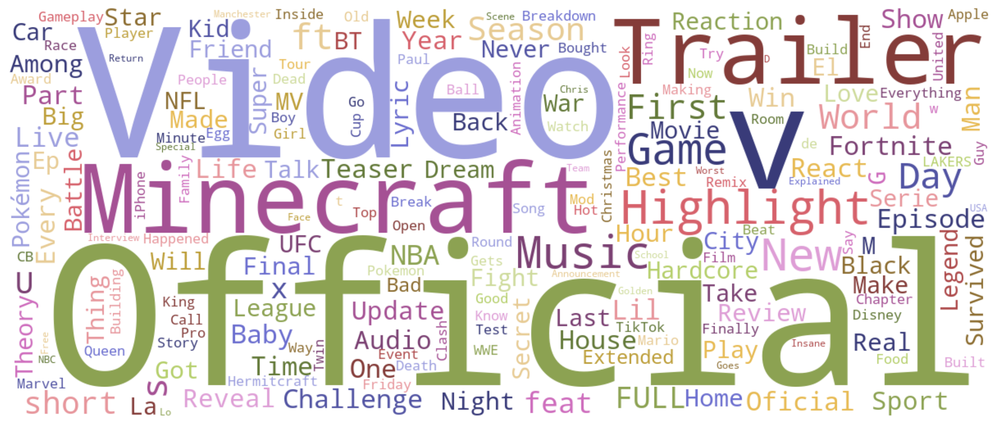

In [33]:
# wc = wordcloud.WordCloud(width=1200, height=600, collocations=False, stopwords=None, background_color="white", colormap="tab20b").generate_from_frequencies(dict(Counter(title_words).most_common(150)))
wc = wordcloud.WordCloud(width=1200, height=500, 
                         collocations=False, background_color="white", 
                         colormap="tab20b").generate(" ".join(title_words))
plt.figure(figsize=(16,11))
plt.imshow(wc, interpolation='bilinear')
_ = plt.axis("off")

# Most Trending Tags for the Music Category

In [34]:
# Filter the dataframe to only include category_id 10

df_category_10_tags = df_US[df_US['categoryId'] == 10]

# Filter the dataframe to only include category_id 10
df_category_10 = df_US[df_US['categoryId'] == 10]

# Combine all the video titles into one string
all_titles = ' '.join(df_category_10['tags'])

# Tokenize the string
tokens = word_tokenize(all_titles.lower())

# Filter out stop words
stop_words = set(stopwords.words('english'))
filtered_tokens = [token for token in tokens if token not in stop_words]

# Count the frequency of each word
word_freq = Counter(filtered_tokens)


# Most Treding Tags of the Music Category 2023

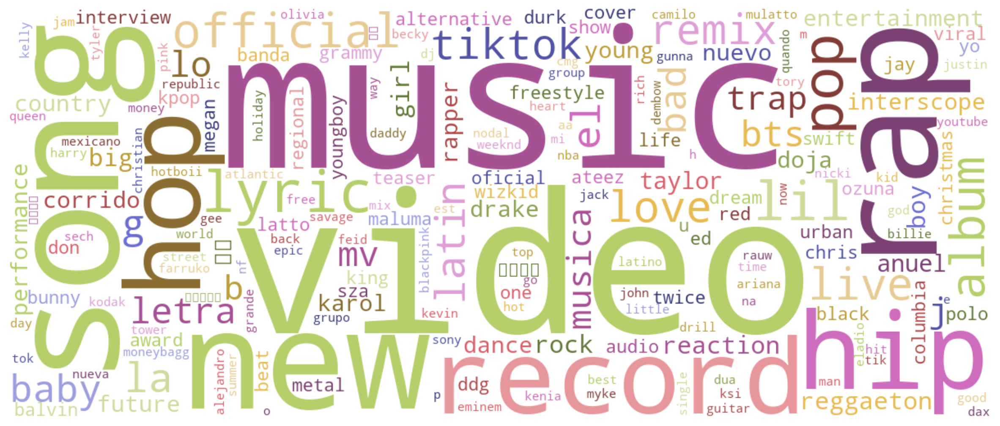

In [35]:
# wc = wordcloud.WordCloud(width=1200, height=600, collocations=False, stopwords=None, background_color="white", colormap="tab20b").generate_from_frequencies(dict(Counter(title_words).most_common(150)))
wc = wordcloud.WordCloud(width=1200, height=500, 
                         collocations=False, background_color="white", 
                         colormap="tab20b").generate(" ".join(word_freq))
plt.figure(figsize=(15,10))
plt.imshow(wc, interpolation='bilinear')
_ = plt.axis("off")

# Most Trending Tags for the Entertainment Industry 

In [36]:
# Filter the dataframe to only include category_id 10

df_category_24_tags = df_US[df_US['categoryId'] == 24]

# Filter the dataframe to only include category_id 24
df_category_24 = df_US[df_US['categoryId'] == 24]

# Combine all the video titles into one string
all_titles = ' '.join(df_category_24['tags'])

# Tokenize the string
tokens = word_tokenize(all_titles.lower())

# Filter out stop words
stop_words = set(stopwords.words('english'))
filtered_tokens = [token for token in tokens if token not in stop_words]

# Count the frequency of each word
word_freq = Counter(filtered_tokens)


# Most trending Tags of Entertainment Category 

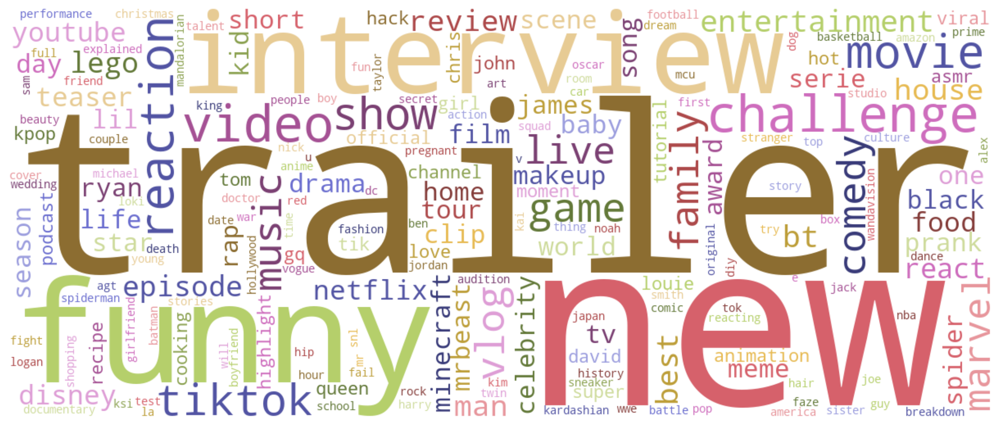

In [37]:
# wc = wordcloud.WordCloud(width=1200, height=600, collocations=False, stopwords=None, background_color="white", colormap="tab20b").generate_from_frequencies(dict(Counter(title_words).most_common(150)))
wc = wordcloud.WordCloud(width=1200, height=500, 
                         collocations=False, background_color="white", 
                         colormap="tab20b").generate(" ".join(word_freq))
plt.figure(figsize=(15,10))
plt.imshow(wc, interpolation='bilinear')
_ = plt.axis("off")

# Most Trending Tags for the People & Blog Category

In [38]:
# Filter the dataframe to only include category_id 22

df_category_22_tags = df_US[df_US['categoryId'] == 22]

# Filter the dataframe to only include category_id 22
df_category_22 = df_US[df_US['categoryId'] == 22]

# Combine all the video titles into one string
all_titles = ' '.join(df_category_22['tags'])

# Tokenize the string
tokens = word_tokenize(all_titles.lower())

# Filter out stop words
stop_words = set(stopwords.words('english'))
filtered_tokens = [token for token in tokens if token not in stop_words]

# Count the frequency of each word
word_freq = Counter(filtered_tokens)

# Most Trending Tags for the People & Blog Category 2023

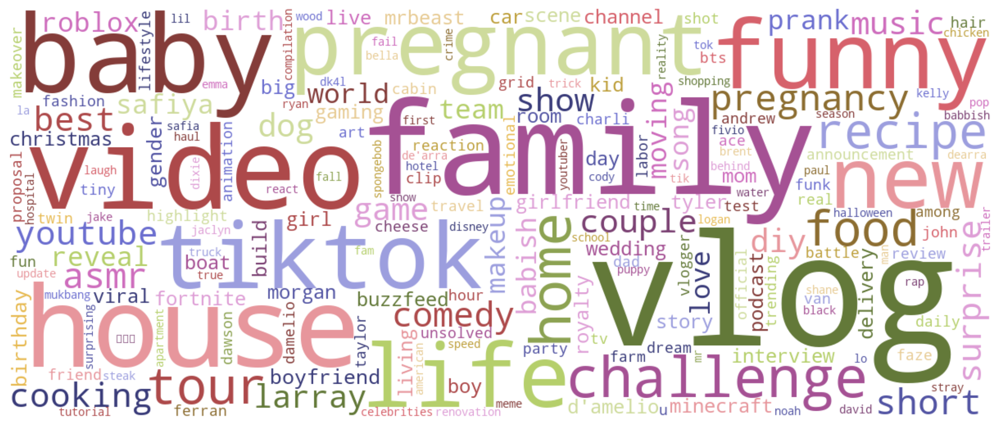

In [39]:
# wc = wordcloud.WordCloud(width=1200, height=600, collocations=False, stopwords=None, background_color="white", colormap="tab20b").generate_from_frequencies(dict(Counter(title_words).most_common(150)))
wc = wordcloud.WordCloud(width=1200, height=500, 
                         collocations=False, background_color="white", 
                         colormap="tab20b").generate(" ".join(word_freq))
plt.figure(figsize=(15,10))
plt.imshow(wc, interpolation='bilinear')
_ = plt.axis("off")

# Most trending meta tags for the Sports Industry

In [45]:
# Filter the dataframe to only include category_id 17

df_category_17_tags = df_US[df_US['categoryId'] == 17]

# Filter the dataframe to only include category_id 17
df_category_17 = df_US[df_US['categoryId'] == 17]

# Combine all the video titles into one string
all_titles = ' '.join(df_category_17['tags'])

# Tokenize the string
tokens = word_tokenize(all_titles.lower())

# Filter out stop words
stop_words = set(stopwords.words('english'))
filtered_tokens = [token for token in tokens if token not in stop_words]

# Count the frequency of each word
word_freq = Counter(filtered_tokens)

# Most Trending Tags for the Sports Category 

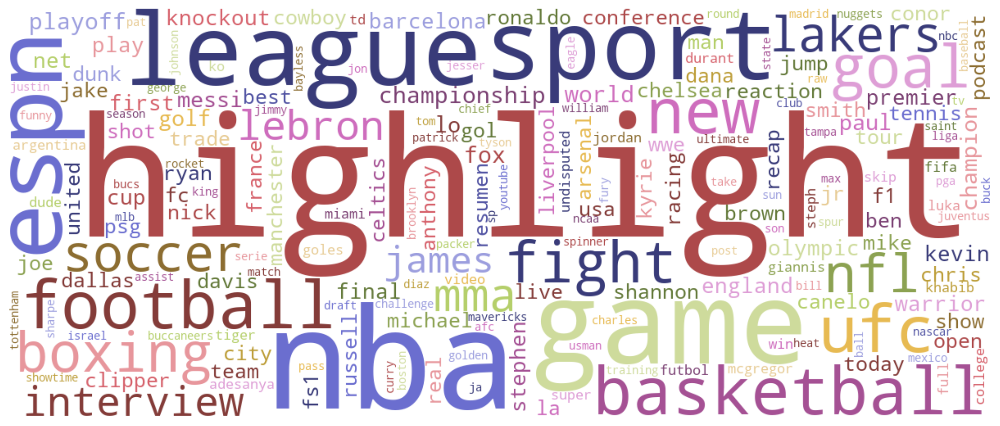

In [46]:
# wc = wordcloud.WordCloud(width=1200, height=600, collocations=False, stopwords=None, background_color="white", colormap="tab20b").generate_from_frequencies(dict(Counter(title_words).most_common(150)))
wc = wordcloud.WordCloud(width=1200, height=500, 
                         collocations=False, background_color="white", 
                         colormap="tab20b").generate(" ".join(word_freq))
plt.figure(figsize=(15,10))
plt.imshow(wc, interpolation='bilinear')
_ = plt.axis("off")

# Most Trending Tags of the "How to" category

In [47]:
# Filter the dataframe to only include category_id 26

df_category_26_tags = df_US[df_US['categoryId'] == 26]

# Filter the dataframe to only include category_id 26
df_category_26 = df_US[df_US['categoryId'] == 26]

# Combine all the video titles into one string
all_titles = ' '.join(df_category_26['tags'])

# Tokenize the string
tokens = word_tokenize(all_titles.lower())

# Filter out stop words
stop_words = set(stopwords.words('english'))
filtered_tokens = [token for token in tokens if token not in stop_words]

# Count the frequency of each word
word_freq = Counter(filtered_tokens)

# Most Trending Tags for the "How to" Category 2023

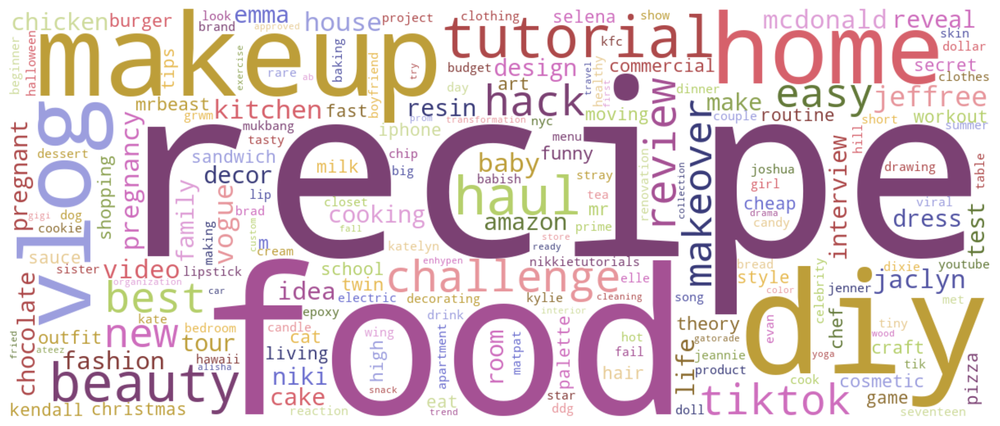

In [48]:
# wc = wordcloud.WordCloud(width=1200, height=600, collocations=False, stopwords=None, background_color="white", colormap="tab20b").generate_from_frequencies(dict(Counter(title_words).most_common(150)))
wc = wordcloud.WordCloud(width=1200, height=500, 
                         collocations=False, background_color="white", 
                         colormap="tab20b").generate(" ".join(word_freq))
plt.figure(figsize=(15,10))
plt.imshow(wc, interpolation='bilinear')
_ = plt.axis("off")

# Most Trending Tags of the Education Category are:

In [49]:
# Filter the dataframe to only include category_id 27

df_category_27_tags = df_US[df_US['categoryId'] == 27]

# Filter the dataframe to only include category_id 26
df_category_27 = df_US[df_US['categoryId'] == 27]

# Combine all the video titles into one string
all_titles = ' '.join(df_category_27['tags'])

# Tokenize the string
tokens = word_tokenize(all_titles.lower())

# Filter out stop words
stop_words = set(stopwords.words('english'))
filtered_tokens = [token for token in tokens if token not in stop_words]

# Count the frequency of each word
word_freq = Counter(filtered_tokens)

# Most Trending Tags of the 'Education' Category

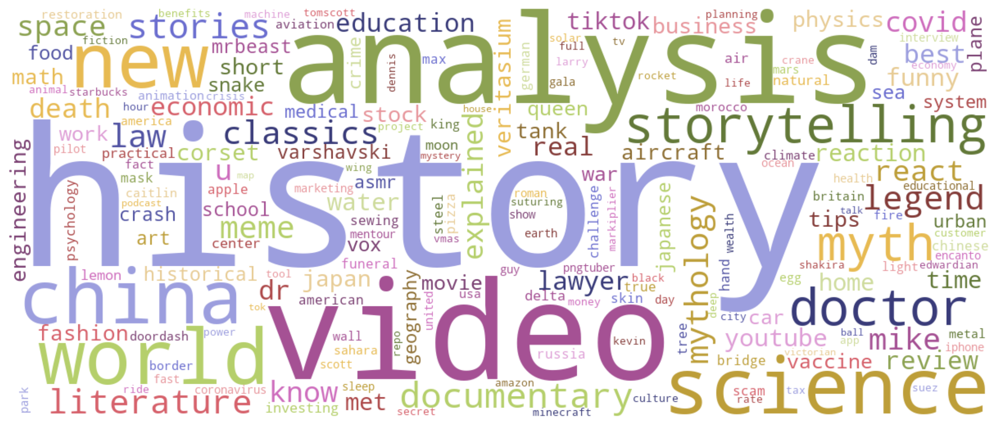

In [50]:
# wc = wordcloud.WordCloud(width=1200, height=600, collocations=False, stopwords=None, background_color="white", colormap="tab20b").generate_from_frequencies(dict(Counter(title_words).most_common(150)))
wc = wordcloud.WordCloud(width=1200, height=500, 
                         collocations=False, background_color="white", 
                         colormap="tab20b").generate(" ".join(word_freq))
plt.figure(figsize=(15,10))
plt.imshow(wc, interpolation='bilinear')
_ = plt.axis("off")

# Most Trending Tags in the Science and Technology group are:

In [51]:
# Filter the dataframe to only include category_id 28

df_category_28_tags = df_US[df_US['categoryId'] == 28]

# Filter the dataframe to only include category_id 28
df_category_28 = df_US[df_US['categoryId'] == 28]

# Combine all the video titles into one string
all_titles = ' '.join(df_category_28['tags'])

# Tokenize the string
tokens = word_tokenize(all_titles.lower())

# Filter out stop words
stop_words = set(stopwords.words('english'))
filtered_tokens = [token for token in tokens if token not in stop_words]

# Count the frequency of each word
word_freq = Counter(filtered_tokens)

# Most Trending Tags of the 'Science / Technology' Category

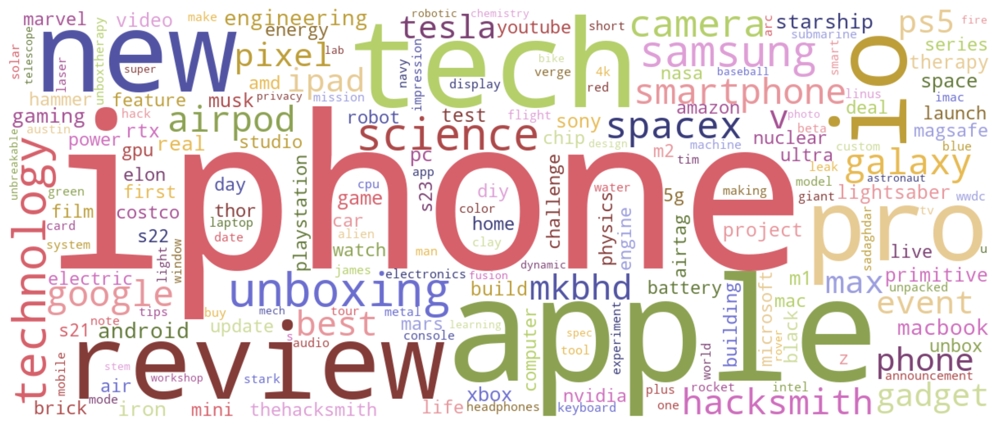

In [52]:
# wc = wordcloud.WordCloud(width=1200, height=600, collocations=False, stopwords=None, background_color="white", colormap="tab20b").generate_from_frequencies(dict(Counter(title_words).most_common(150)))
wc = wordcloud.WordCloud(width=1200, height=500, 
                         collocations=False, background_color="white", 
                         colormap="tab20b").generate(" ".join(word_freq))
plt.figure(figsize=(15,10))
plt.imshow(wc, interpolation='bilinear')
_ = plt.axis("off")